In [32]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.feature_selection import SelectKBest,f_classif

In [33]:
data = pd.read_csv("housing.csv")
data.columns
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [34]:
data.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [36]:
data.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [37]:
data.total_bedrooms.unique()

array([ 129., 1106.,  190., ..., 3008., 1857., 1052.])

In [38]:
data.total_bedrooms.fillna(data['total_bedrooms'].mean(),inplace=True)
data.isnull().sum()

C:\Users\venka\AppData\Local\Temp\ipykernel_1036\2727984700.py:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

In [39]:
import plotly.express as px
px.box(data.select_dtypes(include="float64"))

In [40]:
data.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [41]:
import numpy as np
numcol = ['total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value']

for col in numcol:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    print("column :",col)
    IQR = Q3 - Q1
    print(Q1,Q3,IQR)
    # Define bounds
    lbound = Q1 - 1.5 * IQR
    ubound = Q3 + 1.5 * IQR
    print(lbound,ubound)
    # Replace outliers with the respective bounds
    data[col] = np.where(data[col] > ubound, ubound, 
                            np.where(data[col] < lbound, lbound, data[col]))

column : total_rooms
1447.75 3148.0 1700.25
-1102.625 5698.375
column : total_bedrooms
297.0 643.25 346.25
-222.375 1162.625
column : population
787.0 1725.0 938.0
-620.0 3132.0
column : households
280.0 605.0 325.0
-207.5 1092.5
column : median_income
2.5633999999999997 4.74325 2.17985
-0.7063750000000004 8.013024999999999
column : median_house_value
119600.0 264725.0 145125.0
-98087.5 482412.5


In [42]:
px.box(data.select_dtypes(include="float64"))

In [43]:

le = LabelEncoder()
data["ocean_proximity"] = le.fit_transform(data["ocean_proximity"])

In [44]:
# Normalize data
scaler = StandardScaler()
Y = data['median_house_value']
X = scaler.fit_transform(data.drop(columns = ['median_house_value']))
X = pd.DataFrame(data = X, columns = data.drop(columns = ['median_house_value']).columns)
X.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,-1.327835,1.052548,0.982143,-1.117285,-1.313803,-1.325821,-1.291972,2.541006,1.291089
1,-1.322844,1.043185,-0.607019,2.329936,2.125474,1.389936,2.348314,2.541006,1.291089
2,-1.332827,1.038503,1.856182,-0.697327,-1.099068,-1.098528,-1.099883,2.085156,1.291089
3,-1.337818,1.038503,1.856182,-0.835405,-0.940657,-1.017539,-0.941691,1.111288,1.291089
4,-1.337818,1.038503,1.856182,-0.582857,-0.782246,-1.008395,-0.791033,0.027262,1.291089


In [45]:

# Initialize an empty list to store selected features for different k values
all_selected_features = []

# Iterate through different k values
for k in range(1, 11):
    # Initialize SelectKBest with the current k value
    selector = SelectKBest(score_func=f_classif, k=k)
    
    # Fit the selector to the data
    select1 = selector.fit_transform(X, Y)
    
    # Get the indices of the selected features
    selected_indices = np.argsort(selector.scores_)[::-1][:k]
    
    # Get the column names of the selected features
    selected_features = [X.columns[index] for index in selected_indices]
    
    # Append the selected features for the current k value to the list
    all_selected_features.append(selected_features)

# Print the selected features for each k value
for k, features in enumerate(all_selected_features, start=1):
    print(f"Selected features for k={k}: {features}")

c:\Users\venka\AppData\Local\anaconda3\envs\ML\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:783: UserWarning:

k=10 is greater than n_features=9. All the features will be returned.



Selected features for k=1: ['median_income']
Selected features for k=2: ['median_income', 'total_rooms']
Selected features for k=3: ['median_income', 'total_rooms', 'population']
Selected features for k=4: ['median_income', 'total_rooms', 'population', 'latitude']
Selected features for k=5: ['median_income', 'total_rooms', 'population', 'latitude', 'households']
Selected features for k=6: ['median_income', 'total_rooms', 'population', 'latitude', 'households', 'ocean_proximity']
Selected features for k=7: ['median_income', 'total_rooms', 'population', 'latitude', 'households', 'ocean_proximity', 'total_bedrooms']
Selected features for k=8: ['median_income', 'total_rooms', 'population', 'latitude', 'households', 'ocean_proximity', 'total_bedrooms', 'housing_median_age']
Selected features for k=9: ['median_income', 'total_rooms', 'population', 'latitude', 'households', 'ocean_proximity', 'total_bedrooms', 'housing_median_age', 'longitude']
Selected features for k=10: ['median_income', 't

In [46]:
# Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [47]:
# Define optimized ANN model
model1 = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],), kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    Dropout(0.2),  # 20% dropout for regularization
    Dense(16, activation='relu', kernel_regularizer=tf.keras.regularizers.l2(0.01)),
    Dropout(0.2),  # Another dropout layer
    Dense(1)  # Output layer for regression
])

# Compile the model with Adam optimizer (lower learning rate)
model1.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')

# Define Early Stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

c:\Users\venka\AppData\Local\anaconda3\envs\ML\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [ ]:
# Train the model
history = model1.fit(
    X_train, y_train, 
    epochs=100,  # Increased epochs for better learning (early stopping will stop early if needed)
    validation_data=(X_test, y_test),
    callbacks=[early_stopping],
    verbose=1  # Show training progress
)

Epoch 1/100
516/516 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - loss: 55013457920.0000 - val_loss: 54509641728.0000
Epoch 2/100
516/516 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 56135909376.0000 - val_loss: 54288580608.0000
Epoch 3/100
516/516 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 55052177408.0000 - val_loss: 53746769920.0000
Epoch 4/100
516/516 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 54848348160.0000 - val_loss: 52824096768.0000
Epoch 5/100
516/516 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 53834584064.0000 - val_loss: 51497758720.0000
Epoch 6/100
516/516 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 51930714112.0000 - val_loss: 49756725248.0000
Epoch 7/100
516/516 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 49654509568.0000 - val_loss: 47636164608.0000
Epoch 8/100
516/516 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 47770365952.0000 - val_loss: 45168607232.0000
Epoch 9/100
516/516 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 45037228032.0000 - val_loss: 42398310400.0000
Epoch 10/100
516/516 ━━━━━━━━━━━━━━━━

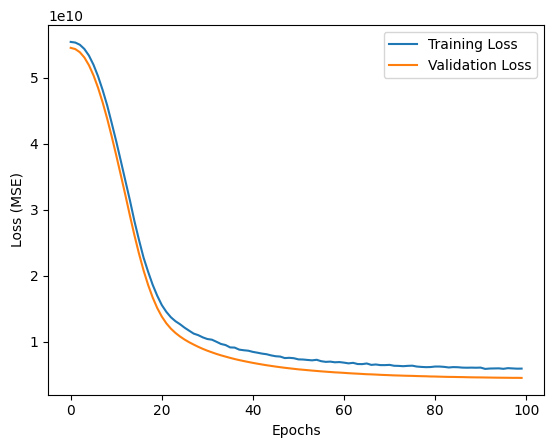

In [ ]:
# Plot training & validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.show()

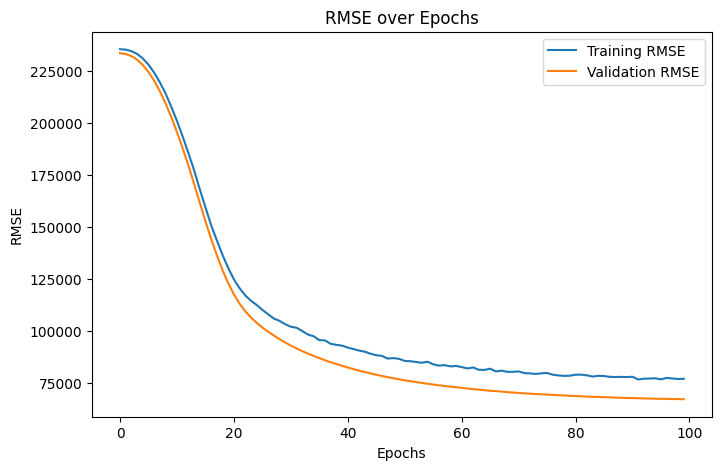

In [ ]:
import numpy as np

# Compute RMSE and MAE for each epoch
train_rmse = np.sqrt(history.history['loss'])
val_rmse = np.sqrt(history.history['val_loss'])

plt.figure(figsize=(8, 5))
plt.plot(train_rmse, label='Training RMSE')
plt.plot(val_rmse, label='Validation RMSE')
plt.xlabel('Epochs')
plt.ylabel('RMSE')
plt.legend()
plt.title('RMSE over Epochs')
plt.show()
